## **install libraries**

In [63]:
!pip install dash


   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---- ----------------------------------- 0.8/7.8 MB 3.7 MB/s eta 0:00:02
   --------- ------------------------------ 1.8/7.8 MB 3.9 MB/s eta 0:00:02
   ------------ --------------------------- 2.4/7.8 MB 3.9 MB/s eta 0:00:02
   ---------------- ----------------------- 3.1/7.8 MB 3.5 MB/s eta 0:00:02
   -------------------- ------------------- 3.9/7.8 MB 3.6 MB/s eta 0:00:02
   ------------------------ --------------- 4.7/7.8 MB 3.6 MB/s eta 0:00:01
   ---------------------------- ----------- 5.5/7.8 MB 3.6 MB/s eta 0:00:01
   --------------------------------- ------ 6.6/7.8 MB 3.7 MB/s eta 0:00:01
   ------------------------------------- -- 7.3/7.8 MB 3.7 MB/s eta 0:00:01
   ---------------------------------------- 7.8/7.8 MB 3.7 MB/s eta 0:00:00


In [2]:
!pip install missingno

In [3]:
!pip install wordcloud

In [4]:
# import Libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

## **Understanding dataset**

In [6]:
# Load the datasets
df= pd.read_csv('U.S._Chronic_Disease_Indicators.csv')

In [7]:
df.head()

,YearStart,YearEnd,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,...,LocationID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
0,2015,2015,AK,Alaska,YRBSS,Alcohol,Alcohol use among youth,NaN,%,Crude Prevalence,...,2,ALC,ALC1_1,CrdPrev,OVERALL,OVR,NaN,NaN,NaN,NaN
1,2015,2015,AL,Alabama,YRBSS,Alcohol,Alcohol use among youth,NaN,%,Crude Prevalence,...,1,ALC,ALC1_1,CrdPrev,OVERALL,OVR,NaN,NaN,NaN,NaN
2,2015,2015,AR,Arkansas,YRBSS,Alcohol,Alcohol use among youth,NaN,%,Crude Prevalence,...,5,ALC,ALC1_1,CrdPrev,OVERALL,OVR,NaN,NaN,NaN,NaN
3,2015,2015,AZ,Arizona,YRBSS,Alcohol,Alcohol use among youth,NaN,%,Crude Prevalence,...,4,ALC,ALC1_1,CrdPrev,OVERALL,OVR,NaN,NaN,NaN,NaN
4,2015,2015,CA,California,YRBSS,Alcohol,Alcohol use among youth,NaN,%,Crude Prevalence,...,6,ALC,ALC1_1,CrdPrev,OVERALL,OVR,NaN,NaN,NaN,NaN


In [8]:
df.tail()

,YearStart,YearEnd,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,...,LocationID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
403979,2001,2001,VT,Vermont,"NVSS, Mortality",Overarching Conditions,Life expectancy at age 65 years,NaN,Years,Number,...,50,OVC,OVC4_2,Nmbr,OVERALL,OVR,NaN,NaN,NaN,NaN
403980,2001,2001,WA,Washington,"NVSS, Mortality",Overarching Conditions,Life expectancy at age 65 years,NaN,Years,Number,...,53,OVC,OVC4_2,Nmbr,OVERALL,OVR,NaN,NaN,NaN,NaN
403981,2001,2001,WI,Wisconsin,"NVSS, Mortality",Overarching Conditions,Life expectancy at age 65 years,NaN,Years,Number,...,55,OVC,OVC4_2,Nmbr,OVERALL,OVR,NaN,NaN,NaN,NaN
403982,2001,2001,WV,West Virginia,"NVSS, Mortality",Overarching Conditions,Life expectancy at age 65 years,NaN,Years,Number,...,54,OVC,OVC4_2,Nmbr,OVERALL,OVR,NaN,NaN,NaN,NaN
403983,2001,2001,WY,Wyoming,"NVSS, Mortality",Overarching Conditions,Life expectancy at age 65 years,NaN,Years,Number,...,56,OVC,OVC4_2,Nmbr,OVERALL,OVR,NaN,NaN,NaN,NaN


In [9]:
# show some information about data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403984 entries, 0 to 403983
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   YearStart                  403984 non-null  int64  
 1   YearEnd                    403984 non-null  int64  
 2   LocationAbbr               403984 non-null  object 
 3   LocationDesc               403984 non-null  object 
 4   DataSource                 403984 non-null  object 
 5   Topic                      403984 non-null  object 
 6   Question                   403984 non-null  object 
 7   Response                   79323 non-null   object 
 8   DataValueUnit              374119 non-null  object 
 9   DataValueType              403984 non-null  object 
 10  DataValue                  297817 non-null  object 
 11  DataValueAlt               273666 non-null  float64
 12  DataValueFootnoteSymbol    188019 non-null  object 
 13  DatavalueFootnote          18

In [10]:
#Show data shape and type
print("Shape of the dataset:", df.shape)  

Shape of the dataset: (403984, 34)


In [11]:
# Summary statistics for numerical and categorical data
print("\nNumerical Summary:\n", df.describe())



Numerical Summary:
            YearStart        YearEnd  DataValueAlt  LowConfidenceLimit  \
count  403984.000000  403984.000000  2.736660e+05       246819.000000   
mean     2012.729851    2012.756698  7.270473e+02           49.729946   
std         1.546388       1.515176  1.798349e+04           83.633664   
min      2001.000000    2001.000000  0.000000e+00            0.200000   
25%      2011.000000    2012.000000  1.890000e+01           13.000000   
50%      2013.000000    2013.000000  4.160000e+01           31.100000   
75%      2014.000000    2014.000000  7.100000e+01           57.400000   
max      2016.000000    2016.000000  3.967333e+06         1293.900000   

       HighConfidenceLimit     LocationID  
count        246819.000000  403984.000000  
mean             62.654180      31.003374  
std              95.980311      17.700259  
min               0.420000       1.000000  
25%              20.200000      17.000000  
50%              45.600000      30.000000  
75%          

In [12]:
print("\nCategorical Summary:\n", df.describe(include=['object']))


Categorical Summary:
        LocationAbbr    LocationDesc DataSource     Topic  \
count        403984          403984     403984    403984   
unique           55              55         33        17   
top              NC  North Carolina      BRFSS  Diabetes   
freq           7779            7779     299921     67342   

                            Question Response DataValueUnit     DataValueType  \
count                         403984    79323        374119            403984   
unique                           202        1            14                19   
top     Mortality from heart failure                      %  Crude Prevalence   
freq                            6136    79323        280119            150281   

       DataValue DataValueFootnoteSymbol  ... ResponseID TopicID QuestionID  \
count     297817                  188019  ...      79323  403984     403984   
unique     20116                      19  ...          1      17        201   
top                              

## **Exploratory Data Analysis : Checking and Cleaning**

In [14]:
# 1. Dataset Overview
print("1. Dataset Size:")
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")

1. Dataset Size:
Rows: 403984, Columns: 34


In [15]:
# 2. Method to get some statistics for the numeric categorical of the data
df.describe(include = 'O')

,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,DataValue,DataValueFootnoteSymbol,...,ResponseID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
count,403984,403984,403984,403984,403984,79323,374119,403984,297817,188019,...,79323,403984,403984,403984,403984,403984,79324,79324,79323,79323
unique,55,55,33,17,202,1,14,19,20116,19,...,1,17,201,19,3,10,1,1,1,1
top,NC,North Carolina,BRFSS,Diabetes,Mortality from heart failure,,%,Crude Prevalence,,****,...,,DIA,CVD1_4,CrdPrev,RACE,OVR,,,,
freq,7779,7779,299921,67342,6136,79323,280119,150281,23064,80363,...,79323,67342,6136,150281,246619,63215,79324,79324,79323,79323


In [16]:
# 3. Checking for unique values in each column
for column in df.columns:
    print(f"Unique values in {column}: {df[column].unique()}")

Unique values in YearStart: [2015 2013 2014 2012 2011 2010 2009 2016 2008 2007 2001]
Unique values in YearEnd: [2015 2013 2014 2012 2011 2010 2016 2008 2007 2001]
Unique values in LocationAbbr: ['AK' 'AL' 'AR' 'AZ' 'CA' 'CO' 'CT' 'DC' 'FL' 'GA' 'GU' 'HI' 'IA' 'ID'
 'IL' 'IN' 'KS' 'KY' 'LA' 'MA' 'MD' 'ME' 'MI' 'MN' 'MO' 'MS' 'MT' 'NC'
 'ND' 'NE' 'NH' 'NJ' 'NM' 'NV' 'NY' 'OH' 'OK' 'OR' 'PA' 'PR' 'RI' 'SC'
 'SD' 'TX' 'US' 'UT' 'VA' 'VT' 'WA' 'WI' 'WV' 'WY' 'DE' 'TN' 'VI']
Unique values in LocationDesc: ['Alaska' 'Alabama' 'Arkansas' 'Arizona' 'California' 'Colorado'
 'Connecticut' 'District of Columbia' 'Florida' 'Georgia' 'Guam' 'Hawaii'
 'Iowa' 'Idaho' 'Illinois' 'Indiana' 'Kansas' 'Kentucky' 'Louisiana'
 'Massachusetts' 'Maryland' 'Maine' 'Michigan' 'Minnesota' 'Missouri'
 'Mississippi' 'Montana' 'North Carolina' 'North Dakota' 'Nebraska'
 'New Hampshire' 'New Jersey' 'New Mexico' 'Nevada' 'New York' 'Ohio'
 'Oklahoma' 'Oregon' 'Pennsylvania' 'Puerto Rico' 'Rhode Island'
 'South Caroli

In [17]:
print("\n4. Data Type:")
print(df.dtypes)


4. Data Type:
YearStart                      int64
YearEnd                        int64
LocationAbbr                  object
LocationDesc                  object
DataSource                    object
Topic                         object
Question                      object
Response                      object
DataValueUnit                 object
DataValueType                 object
DataValue                     object
DataValueAlt                 float64
DataValueFootnoteSymbol       object
DatavalueFootnote             object
LowConfidenceLimit           float64
HighConfidenceLimit          float64
StratificationCategory1       object
Stratification1               object
StratificationCategory2       object
Stratification2               object
StratificationCategory3       object
Stratification3               object
GeoLocation                   object
ResponseID                    object
LocationID                     int64
TopicID                       object
QuestionID             

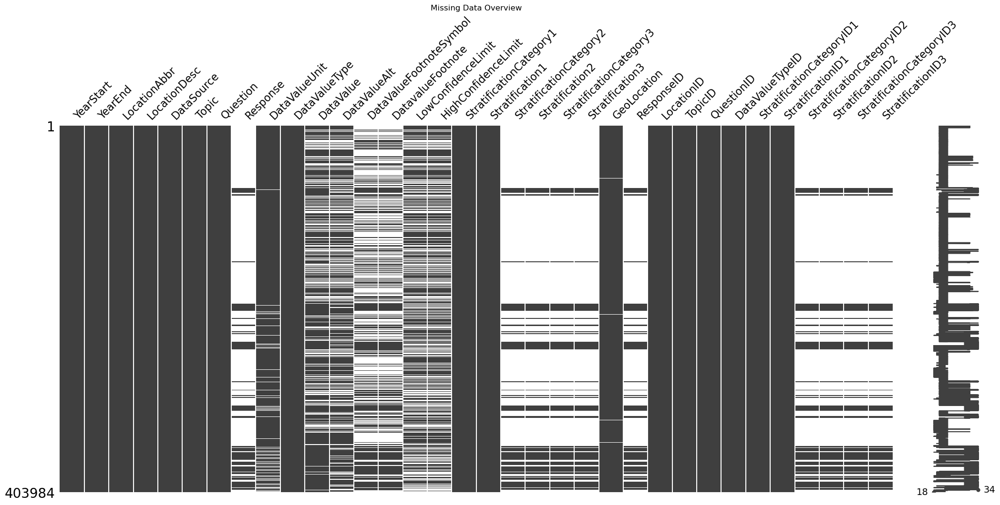

Missing Percentages:
 YearStart                     0.000000
YearEnd                       0.000000
LocationAbbr                  0.000000
LocationDesc                  0.000000
DataSource                    0.000000
Topic                         0.000000
Question                      0.000000
Response                     80.364816
DataValueUnit                 7.392620
DataValueType                 0.000000
DataValue                    26.280001
DataValueAlt                 32.258208
DataValueFootnoteSymbol      53.458800
DatavalueFootnote            53.499891
LowConfidenceLimit           38.903768
HighConfidenceLimit          38.903768
StratificationCategory1       0.000000
Stratification1               0.000000
StratificationCategory2      80.364816
Stratification2              80.364816
StratificationCategory3      80.364816
Stratification3              80.364816
GeoLocation                   0.635669
ResponseID                   80.364816
LocationID                    0.000000
Top

In [18]:
# Visualize missing data
msno.matrix(df)
plt.title("Missing Data Overview")
plt.show()

# Calculate missing value percentages
missing_percent = df.isnull().mean() * 100
print("Missing Percentages:\n", missing_percent)

**Cleaning**

In [20]:
#Step 1: check number of duplicated values 
df.duplicated().sum() 

10

In [21]:
df.drop_duplicates(inplace=True) # drop duplicated 

In [22]:
#Step 2: clear unrelevent/unwanted columns 
# List of columns to drop (corrected)
# Ensure case consistency by printing column names
print("Corrected Column Names:", df.columns.tolist())

# List of columns to drop (corrected and case-verified)
columns_to_drop = [
    "LocationAbbr", "ResponseID", "LocationID", "TopicID", "QuestionID", 
    "DataValueTypeID", "StratificationCategoryID1", 
    "StratificationCategoryID2", "StratificationID2", "StratificationCategory3", 
    "StratificationID3", "Stratification3", "Stratification2", 
    "StratificationCategory2", "DataValueFootnoteSymbol", "DataValueFootnote", 
    "Response", "DataValueUnit", "StratificationCategoryID3","DatavalueFootnote","DataSource","GeoLocation","StratificationID1"
]

# Verify if problematic columns exist
missing_columns = [col for col in columns_to_drop if col not in df.columns]
if missing_columns:
    print(f"Warning: These columns were not found in the DataFrame: {missing_columns}")

# Drop only existing columns
df.drop(columns=[col for col in columns_to_drop if col in df.columns], inplace=True)

# Print remaining columns
print("Remaining Columns:", df.columns.tolist())


Corrected Column Names: ['YearStart', 'YearEnd', 'LocationAbbr', 'LocationDesc', 'DataSource', 'Topic', 'Question', 'Response', 'DataValueUnit', 'DataValueType', 'DataValue', 'DataValueAlt', 'DataValueFootnoteSymbol', 'DatavalueFootnote', 'LowConfidenceLimit', 'HighConfidenceLimit', 'StratificationCategory1', 'Stratification1', 'StratificationCategory2', 'Stratification2', 'StratificationCategory3', 'Stratification3', 'GeoLocation', 'ResponseID', 'LocationID', 'TopicID', 'QuestionID', 'DataValueTypeID', 'StratificationCategoryID1', 'StratificationID1', 'StratificationCategoryID2', 'StratificationID2', 'StratificationCategoryID3', 'StratificationID3']
Remaining Columns: ['YearStart', 'YearEnd', 'LocationDesc', 'Topic', 'Question', 'DataValueType', 'DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit', 'StratificationCategory1', 'Stratification1']


In [23]:
# Print corrected column names for verification
print("Normalized Column Names:", df.columns.tolist())

Normalized Column Names: ['YearStart', 'YearEnd', 'LocationDesc', 'Topic', 'Question', 'DataValueType', 'DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit', 'StratificationCategory1', 'Stratification1']


In [24]:
#Final Review of Remaining Columns
#Check for unique values and consistency
print("Year Range:", df['YearStart'].min(), "-", df['YearEnd'].max())
print("Unique Locations:\n", df['LocationDesc'].nunique())
print("Unique Topics:\n", df['Topic'].unique())
print("Unique DataValueType:\n", df['DataValueType'].unique())
print("\nSummary of Numeric Columns:")
print(df[['DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit']].describe())


Year Range: 2001 - 2016
Unique Locations:
 55
Unique Topics:
 ['Alcohol' 'Asthma' 'Arthritis' 'Cancer' 'Diabetes'
 'Overarching Conditions' 'Tobacco' 'Chronic Kidney Disease'
 'Chronic Obstructive Pulmonary Disease' 'Cardiovascular Disease'
 'Immunization' 'Mental Health'
 'Nutrition, Physical Activity, and Weight Status' 'Reproductive Health'
 'Oral Health' 'Older Adults' 'Disability']
Unique DataValueType:
 ['Crude Prevalence' 'Age-adjusted Prevalence' 'Number' 'Mean'
 'Age-adjusted Mean' 'Crude Rate' 'Median'
 'Adjusted by age, sex, race and ethnicity' 'Percent' 'Age-adjusted Rate'
 'Average Annual Number' 'Yes/No' 'Average Annual Age-adjusted Rate'
 'Average Annual Crude Rate' 'US Dollars'
 'Commercial host (dram shop) liability status for alcohol service'
 'Local control of the regulation of alcohol outlet density'
 'Per capita alcohol consumption' 'Prevalence']

Summary of Numeric Columns:
       DataValueAlt  LowConfidenceLimit  HighConfidenceLimit
count  2.736660e+05       2468

# **Handle Missing Values** 

In [26]:
# Checking for missing values in the dataset
missing_df= df.isnull().sum()
missing_percentage = (missing_df / len(df)) * 100

# Display missing data count and percentage
missing_data_summary = pd.DataFrame({
    'Missing Values': missing_df,
    'Percentage': missing_percentage
}).sort_values(by='Percentage', ascending=False)

missing_data_summary

,Missing Values,Percentage
LowConfidenceLimit,157155,38.902256
HighConfidenceLimit,157155,38.902256
DataValueAlt,130308,32.256531
DataValue,106157,26.278176
YearStart,0,0.000000
YearEnd,0,0.000000
LocationDesc,0,0.000000
Topic,0,0.000000
Question,0,0.000000
DataValueType,0,0.000000


In [27]:
#2. Focus on Essential Columns
# Impute missing numeric values with the median
# Convert column to numeric, setting errors='coerce' to handle non-numeric values
df['DataValue'] = pd.to_numeric(df['DataValue'], errors='coerce')
df['DataValueAlt'] = pd.to_numeric(df['DataValueAlt'], errors='coerce')
df['LowConfidenceLimit'] = pd.to_numeric(df['LowConfidenceLimit'], errors='coerce')
df['HighConfidenceLimit'] = pd.to_numeric(df['HighConfidenceLimit'], errors='coerce')

df['DataValue'] = df['DataValue'].fillna(df['DataValue'].median())
df['DataValueAlt'] = df['DataValueAlt'].fillna(df['DataValueAlt'].median())
df['LowConfidenceLimit'] = df['LowConfidenceLimit'].fillna(df['LowConfidenceLimit'].median())
df['HighConfidenceLimit'] = df['HighConfidenceLimit'].fillna(df['HighConfidenceLimit'].median())

In [28]:
# Verify missing values are handled
print("Missing values after imputation:")
print(df[['DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit']].isnull().sum())

Missing values after imputation:
DataValue              0
DataValueAlt           0
LowConfidenceLimit     0
HighConfidenceLimit    0
dtype: int64


In [29]:
#Check Percentage of Missing Values for verfication 
missing_percentage = df.isnull().sum() / len(df) * 100
print(missing_percentage)

YearStart                  0.0
YearEnd                    0.0
LocationDesc               0.0
Topic                      0.0
Question                   0.0
DataValueType              0.0
DataValue                  0.0
DataValueAlt               0.0
LowConfidenceLimit         0.0
HighConfidenceLimit        0.0
StratificationCategory1    0.0
Stratification1            0.0
dtype: float64


# **Univariate Analysis and Multivariant Analysis**

In [31]:
# 1. Identifying numerical and categorical columns
numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(include=[object, 'category']).columns.tolist()

# Display the columns
print(f"Numerical columns: {numerical_cols}")
print(f"Categorical columns: {categorical_cols}")

Numerical columns: ['YearStart', 'YearEnd', 'DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit']
Categorical columns: ['LocationDesc', 'Topic', 'Question', 'DataValueType', 'StratificationCategory1', 'Stratification1']


**Numerical Data**

In [33]:
# Descriptive statistics for numerical columns
numerical_summary = df[numerical_cols].describe()
print(numerical_summary)

           YearStart        YearEnd     DataValue  DataValueAlt  \
count  403974.000000  403974.000000  4.039740e+05  4.039740e+05   
mean     2012.729879    2012.756727  5.059457e+02  5.059457e+02   
std         1.546395       1.515182  1.480503e+04  1.480503e+04   
min      2001.000000    2001.000000  0.000000e+00  0.000000e+00   
25%      2011.000000    2012.000000  2.960000e+01  2.960000e+01   
50%      2013.000000    2013.000000  4.160000e+01  4.160000e+01   
75%      2014.000000    2014.000000  5.800000e+01  5.800000e+01   
max      2016.000000    2016.000000  3.967333e+06  3.967333e+06   

       LowConfidenceLimit  HighConfidenceLimit  
count       403974.000000        403974.000000  
mean            42.482477            56.019719  
std             66.000183            75.482311  
min              0.200000             0.420000  
25%             24.700000            36.400000  
50%             31.100000            45.600000  
75%             39.200000            56.400000  
max 

**categorical Data**

In [35]:
# Descriptive statistics for categorical columns
categorical_summary = df[categorical_cols].describe()
print(categorical_summary)


          LocationDesc     Topic                      Question  \
count           403974    403974                        403974   
unique              55        17                           202   
top     North Carolina  Diabetes  Mortality from heart failure   
freq              7779     67338                          6136   

           DataValueType StratificationCategory1 Stratification1  
count             403974                  403974          403974  
unique                19                       3              10  
top     Crude Prevalence          Race/Ethnicity         Overall  
freq              150273                  246619           63205  


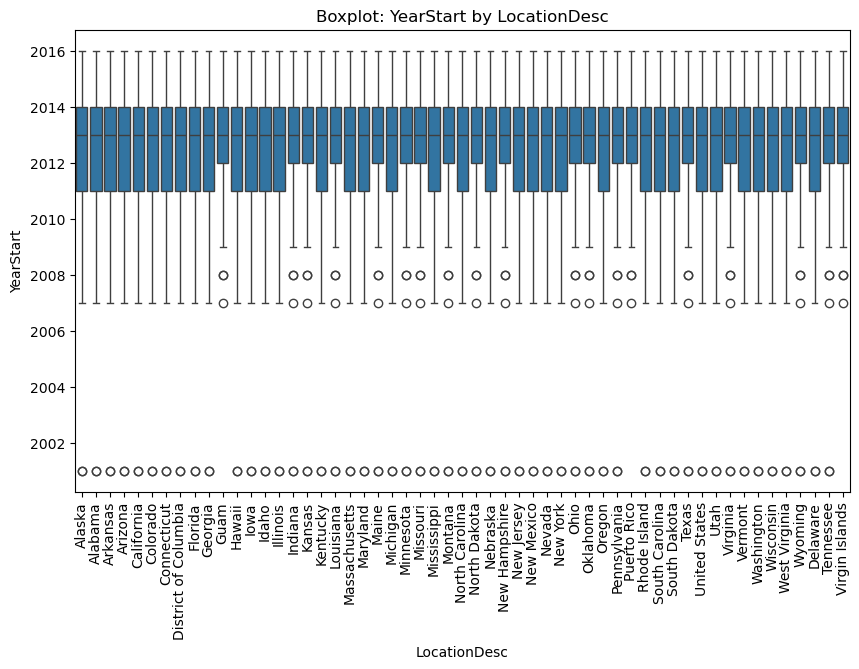

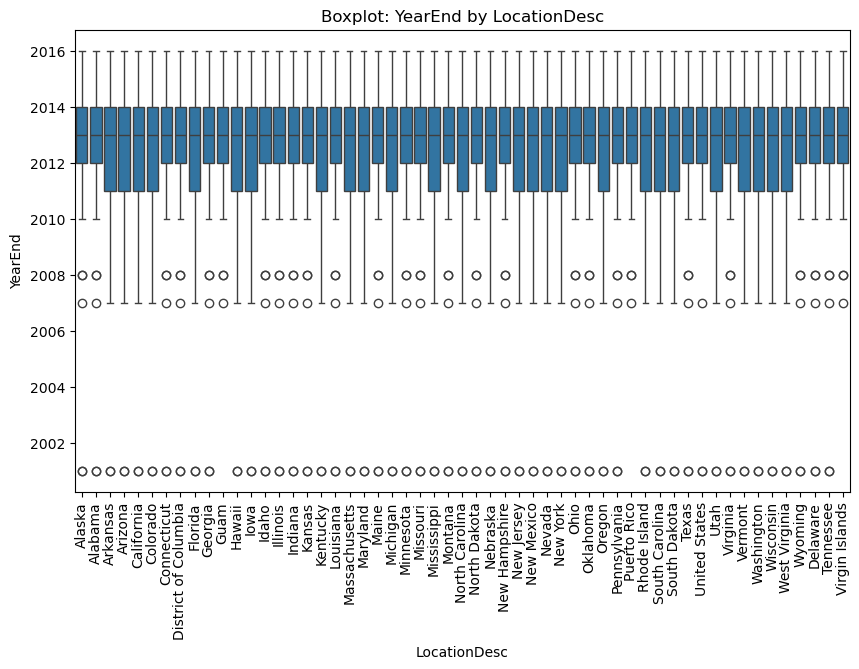

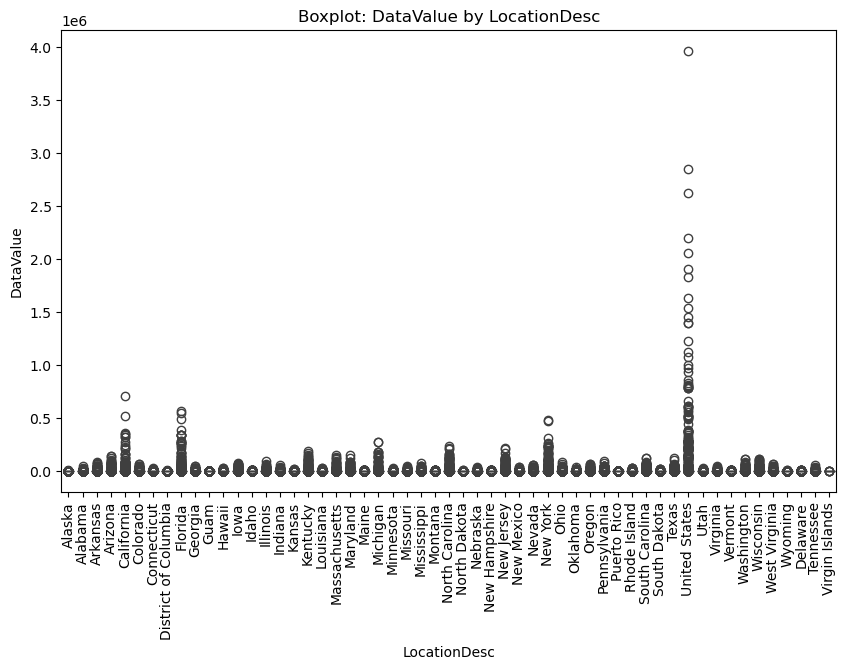

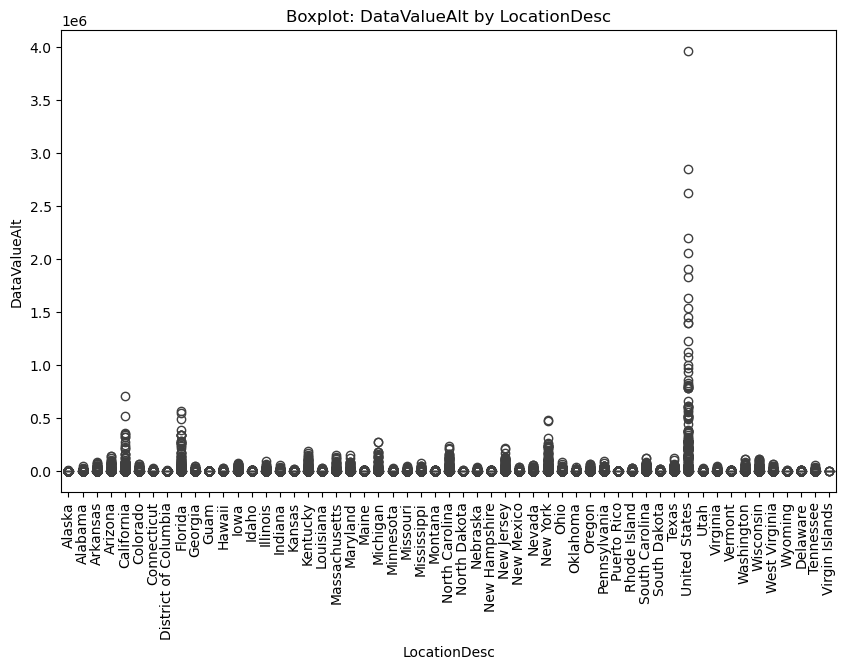

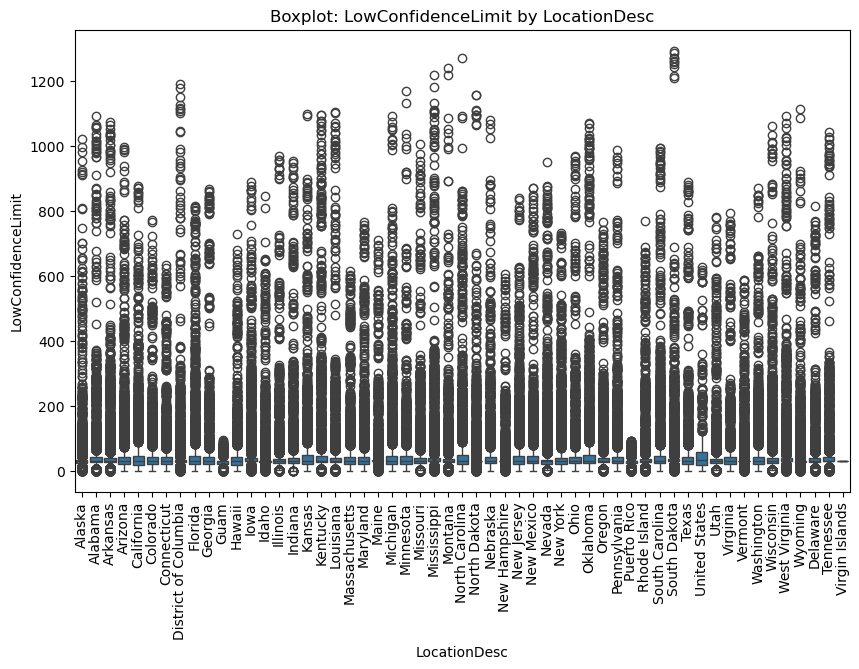

...

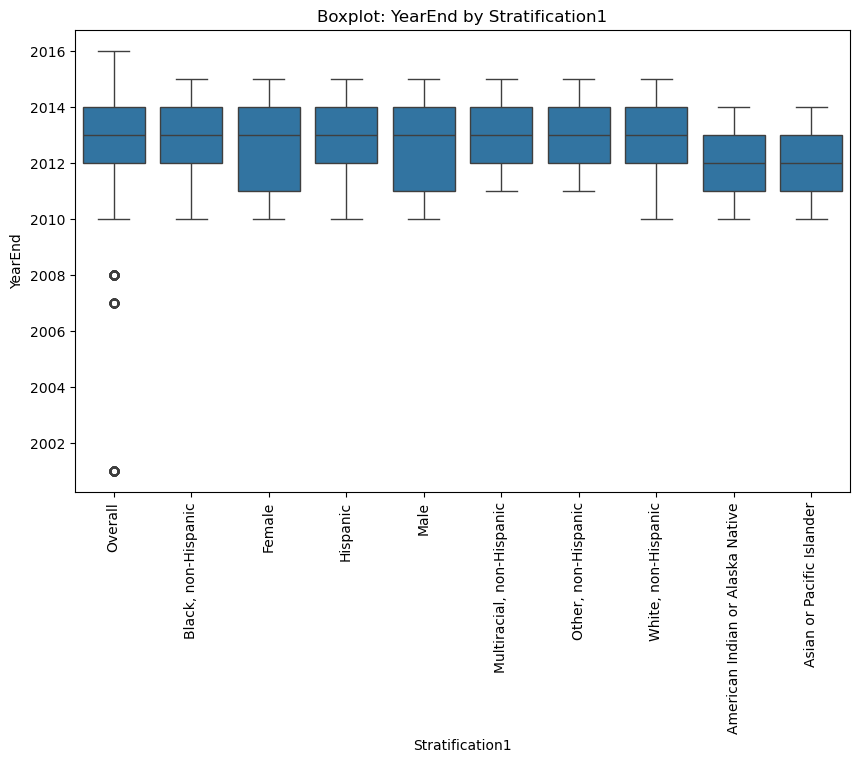

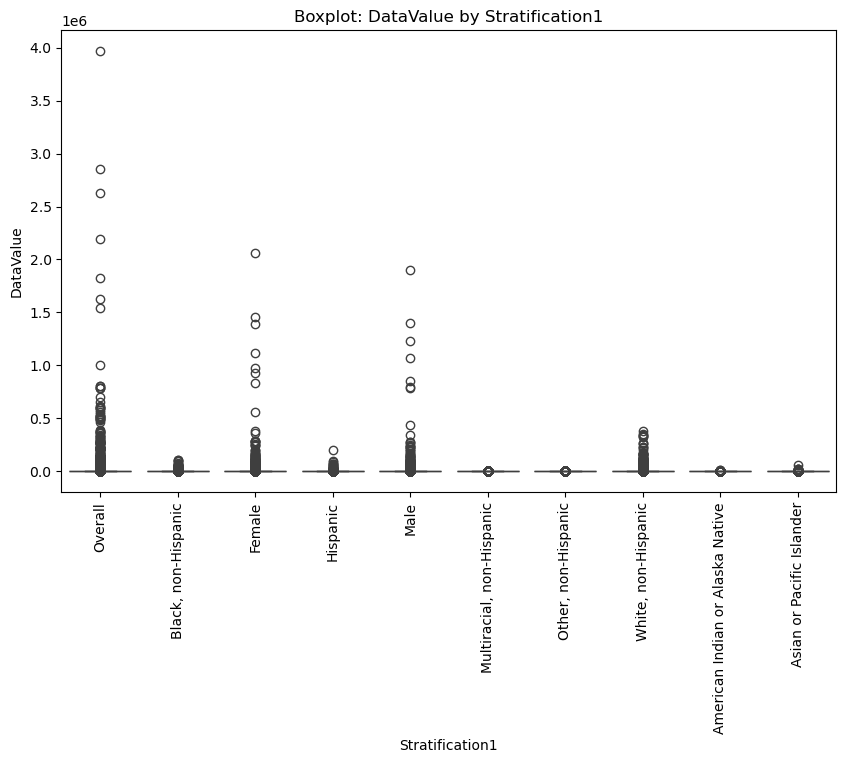

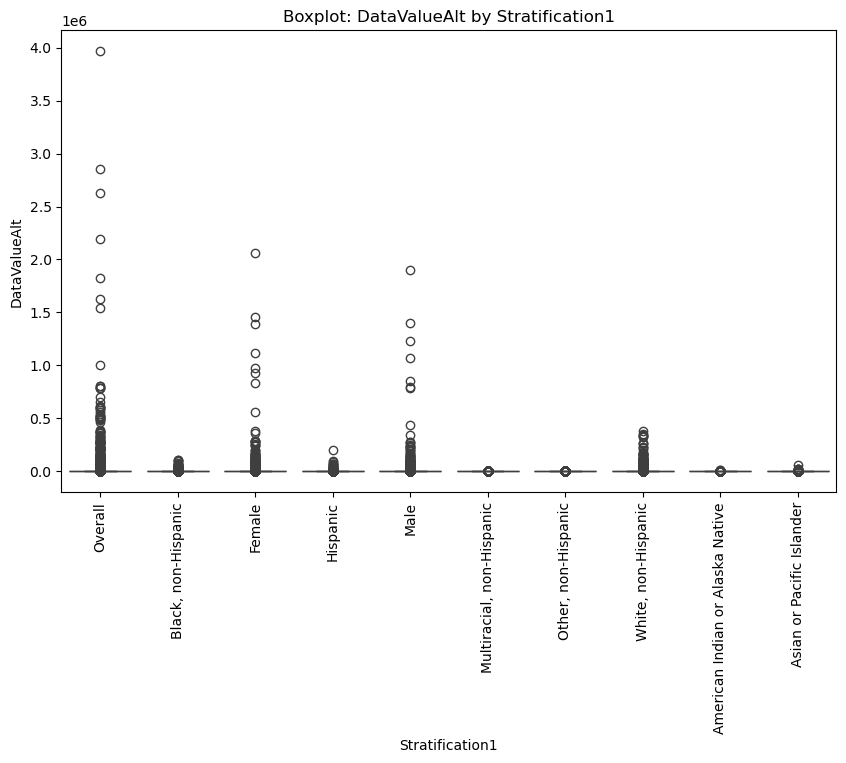

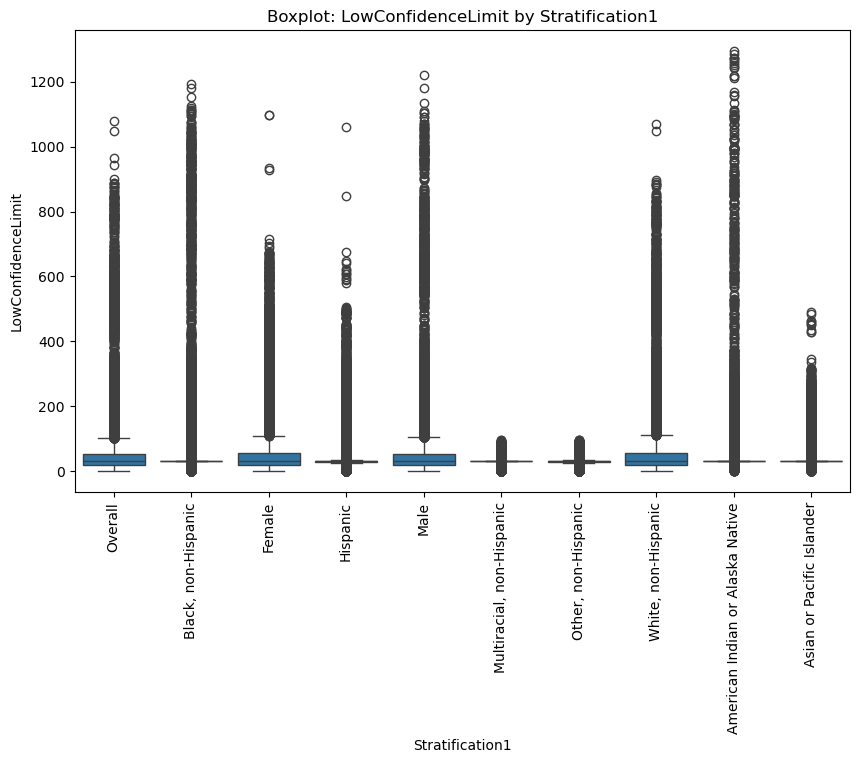

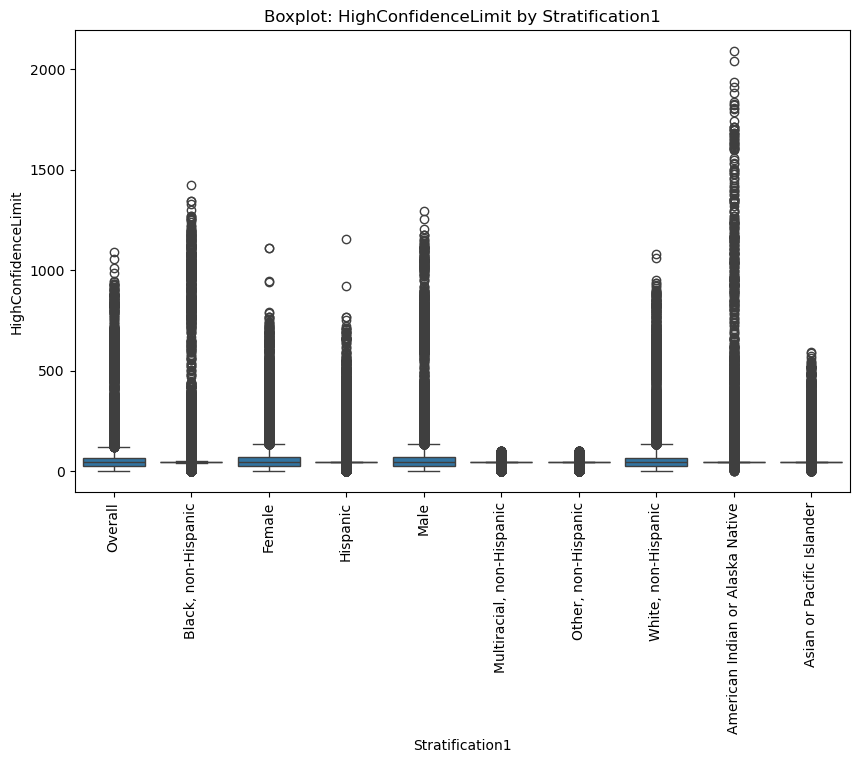

In [36]:
#Multivariant 
import seaborn as sns
import matplotlib.pyplot as plt

# Loop through all categorical columns
for cat_col in categorical_cols:
    # Loop through all numerical columns
    for num_col in numerical_cols:
        # Create a boxplot for each combination of numerical and categorical columns
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        plt.title(f'Boxplot: {num_col} by {cat_col}')
        plt.show()

### Now data is cleaned and ready to check its outliers

## **Checking outliers for numerical data**

In [39]:
#Confirm that data is balanced now 
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 403974 entries, 0 to 403983
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   YearStart                403974 non-null  int64  
 1   YearEnd                  403974 non-null  int64  
 2   LocationDesc             403974 non-null  object 
 3   Topic                    403974 non-null  object 
 4   Question                 403974 non-null  object 
 5   DataValueType            403974 non-null  object 
 6   DataValue                403974 non-null  float64
 7   DataValueAlt             403974 non-null  float64
 8   LowConfidenceLimit       403974 non-null  float64
 9   HighConfidenceLimit      403974 non-null  float64
 10  StratificationCategory1  403974 non-null  object 
 11  Stratification1          403974 non-null  object 
dtypes: float64(4), int64(2), object(6)
memory usage: 40.1+ MB


<Axes: xlabel='YearStart', ylabel='Density'>

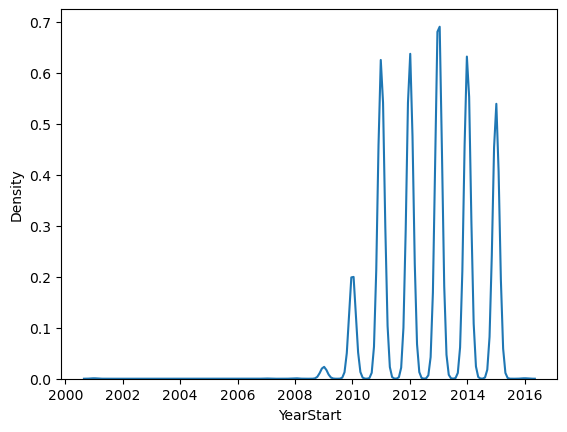

In [40]:
sns.kdeplot(data= df, x= 'YearStart')

<Axes: xlabel='YearEnd', ylabel='Density'>

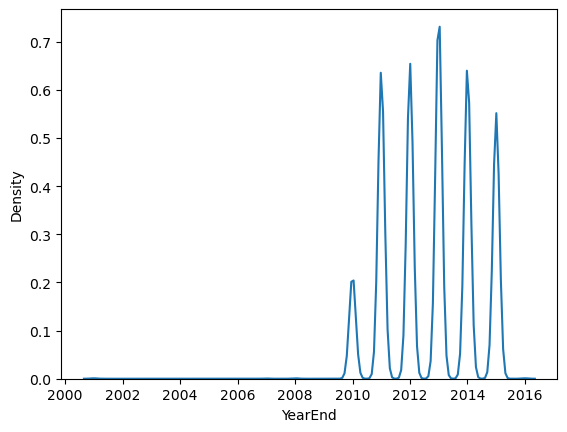

In [41]:
sns.kdeplot(data= df, x= 'YearEnd')

<Axes: xlabel='HighConfidenceLimit', ylabel='Density'>

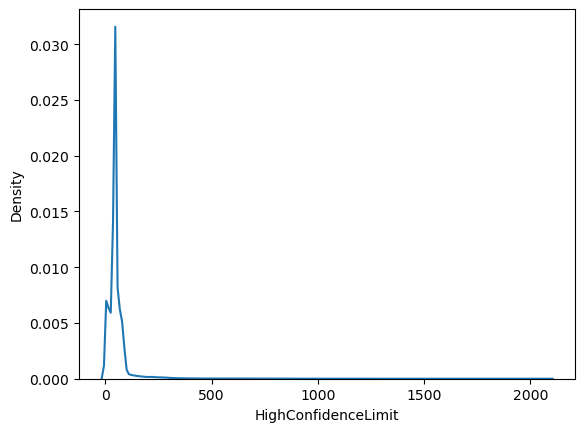

In [42]:
sns.kdeplot(data= df, x= 'HighConfidenceLimit') 

<Axes: xlabel='DataValue', ylabel='Density'>

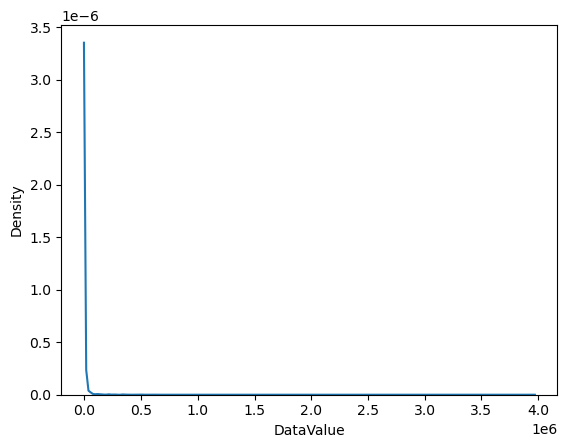

In [43]:
sns.kdeplot(data= df, x= 'DataValue') 

<Axes: xlabel='DataValueAlt', ylabel='Density'>

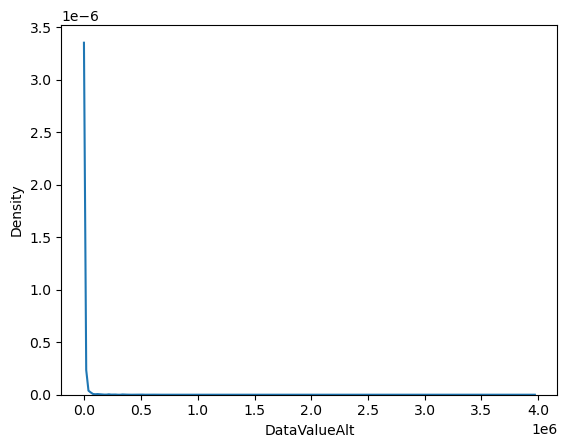

In [44]:
sns.kdeplot(data= df, x= 'DataValueAlt') 

<Axes: xlabel='LowConfidenceLimit', ylabel='Density'>

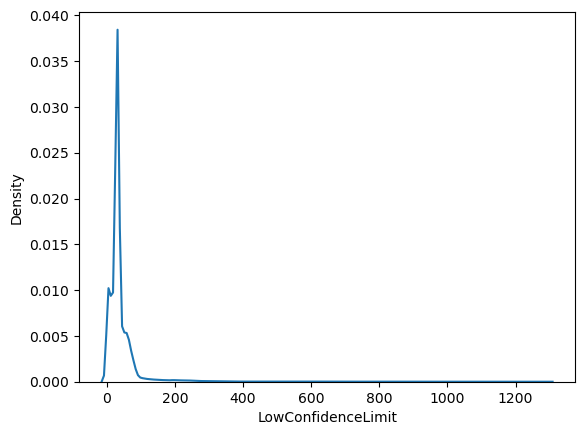

In [45]:
sns.kdeplot(data= df, x= 'LowConfidenceLimit') 

It shows that there is so much outliers

Capping outliers:is the process of limiting the values of extreme outliers in the data to a specified threshold, rather than removing them entirely. This approach is helpful when you want to reduce the impact of outliers but still preserve the data integrity. In the case of capping, instead of removing or replacing outliers with missing values, we replace them with the maximum or minimum acceptable value based on a defined range.

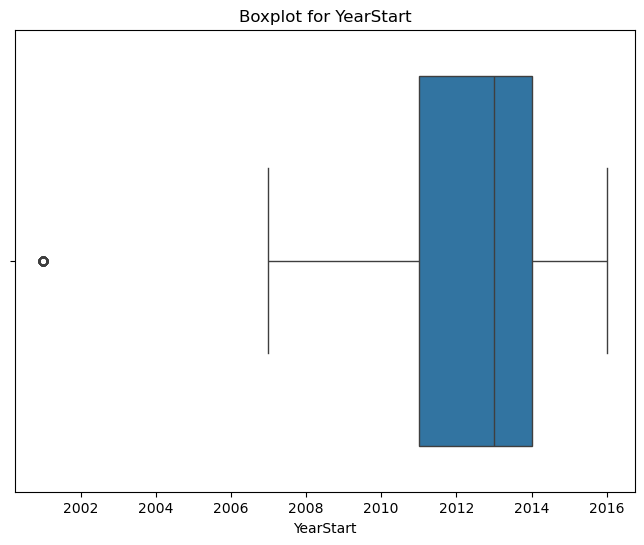

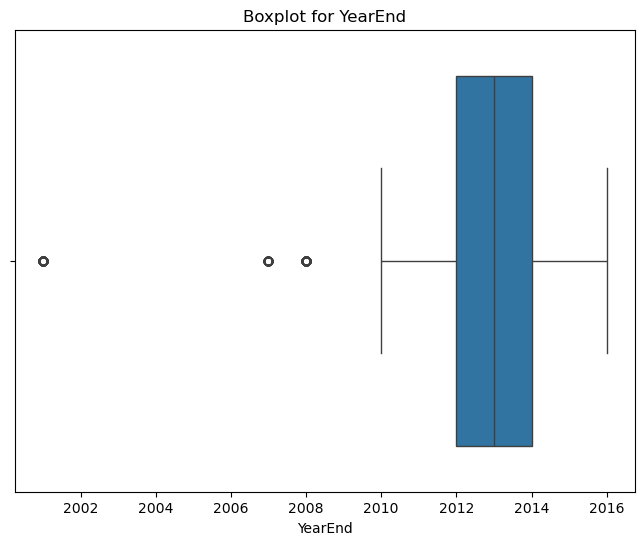

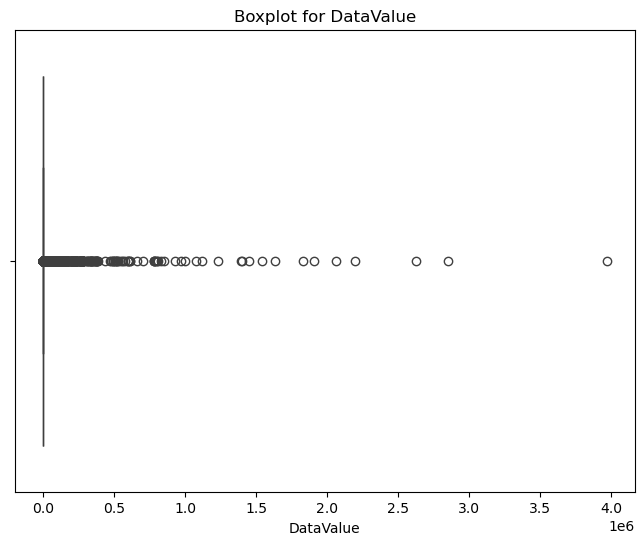

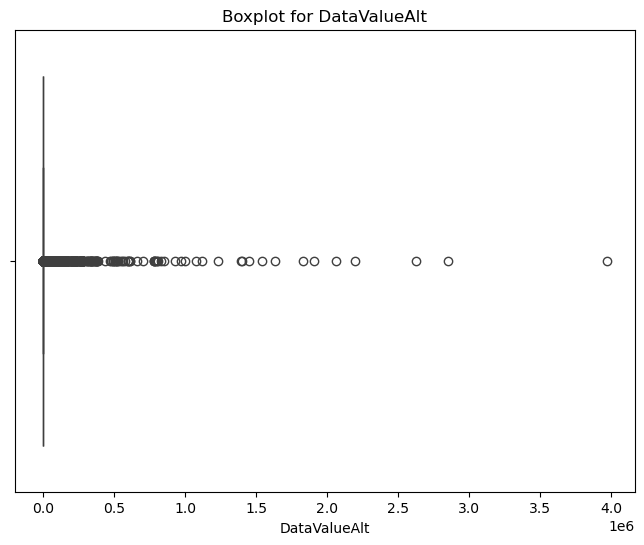

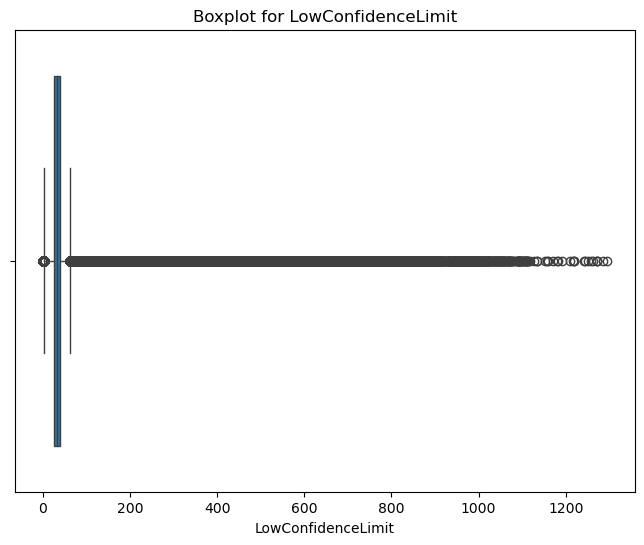

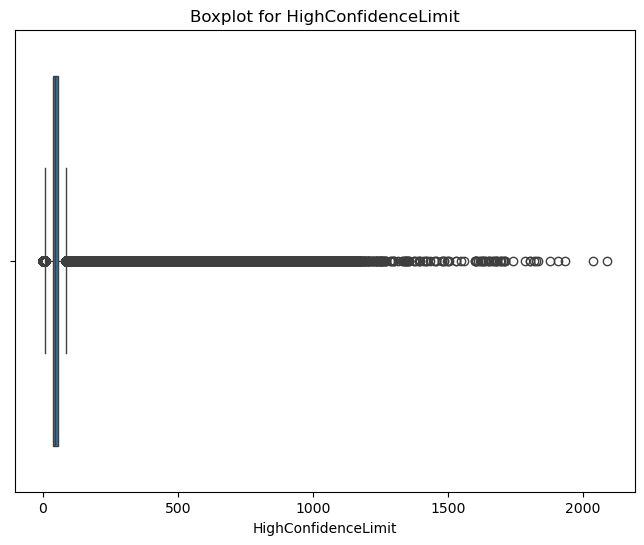

After handling outliers (capping):


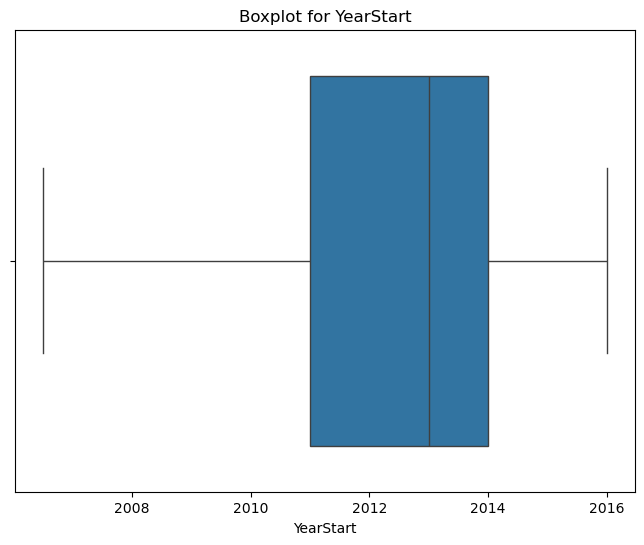

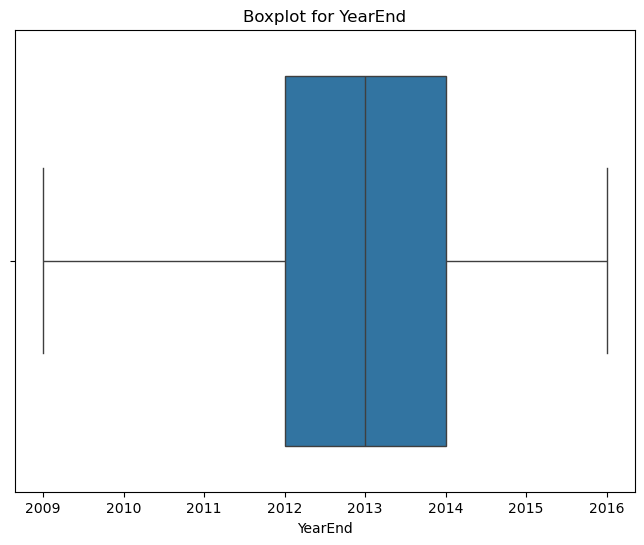

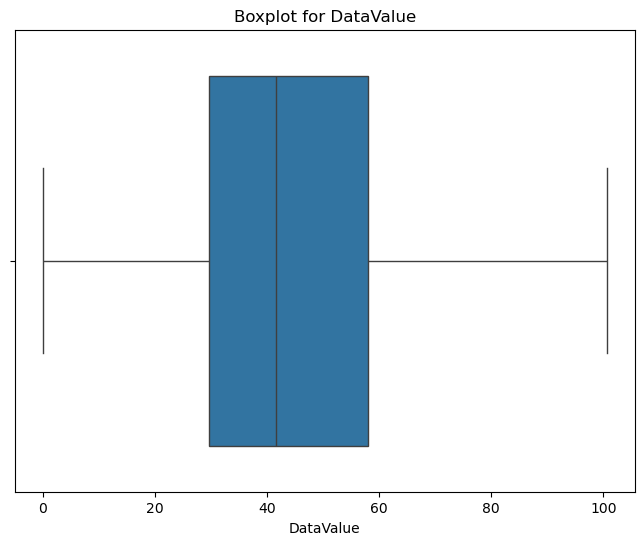

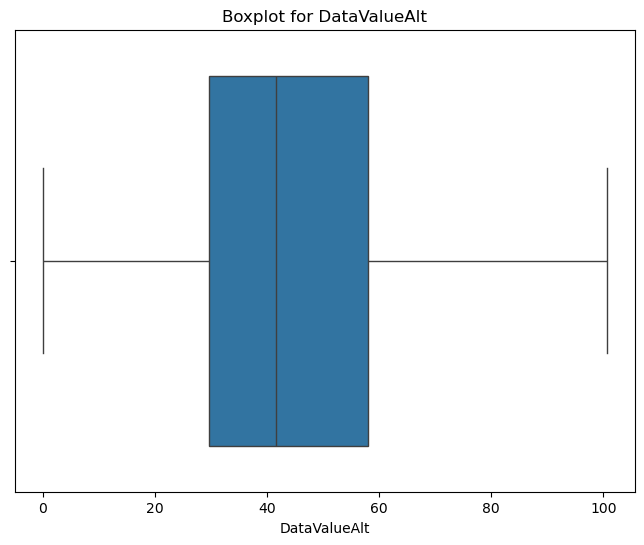

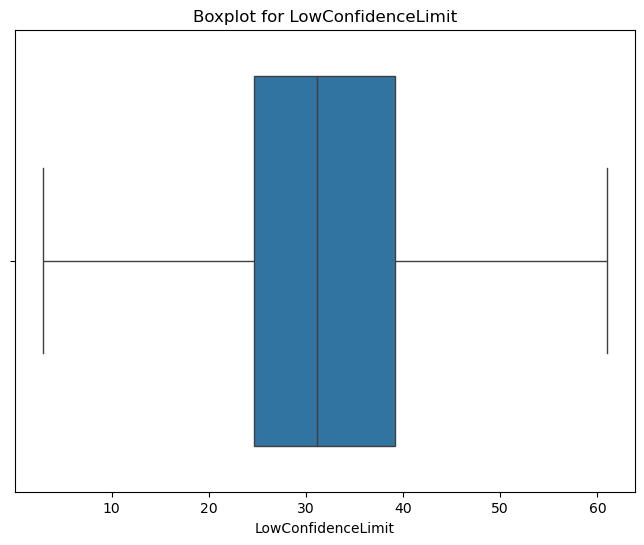

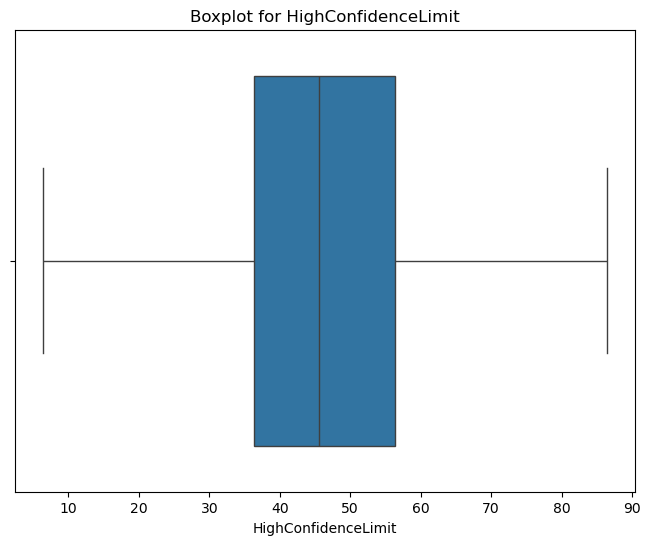


Summary statistics before capping:
           YearStart        YearEnd     DataValue  DataValueAlt  \
count  403974.000000  403974.000000  4.039740e+05  4.039740e+05   
mean     2012.729879    2012.756727  5.059457e+02  5.059457e+02   
std         1.546395       1.515182  1.480503e+04  1.480503e+04   
min      2001.000000    2001.000000  0.000000e+00  0.000000e+00   
25%      2011.000000    2012.000000  2.960000e+01  2.960000e+01   
50%      2013.000000    2013.000000  4.160000e+01  4.160000e+01   
75%      2014.000000    2014.000000  5.800000e+01  5.800000e+01   
max      2016.000000    2016.000000  3.967333e+06  3.967333e+06   

       LowConfidenceLimit  HighConfidenceLimit  
count       403974.000000        403974.000000  
mean            42.482477            56.019719  
std             66.000183            75.482311  
min              0.200000             0.420000  
25%             24.700000            36.400000  
50%             31.100000            45.600000  
75%             3

In [48]:
# Function to visualize outliers
# Function to detect outliers using IQR
def detect_outliers_iqr(df, numerical_cols):
    outliers = {}
    for col in numerical_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers
def plot_boxplots(df, numerical_cols):
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df[col])
        plt.title(f"Boxplot for {col}")
        plt.show()
# Function to cap outliers (Winsorization)
def cap_outliers(df, numerical_cols):
    for col in numerical_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    return df

# Identify outliers
numerical_cols = ['YearStart', 'YearEnd', 'DataValue', 'DataValueAlt', 'LowConfidenceLimit', 'HighConfidenceLimit']
outliers_iqr = detect_outliers_iqr(df, numerical_cols)

# Visualize outliers
plot_boxplots(df, numerical_cols)

# Handle outliers (capping them using Winsorization)
df_capped = cap_outliers(df.copy(), numerical_cols)

# Verify the impact of capping by visualizing again
print("After handling outliers (capping):")
plot_boxplots(df_capped, numerical_cols)

# Check summary statistics before and after capping to verify the changes
print("\nSummary statistics before capping:")
print(df[numerical_cols].describe())

print("\nSummary statistics after capping:")
print(df_capped[numerical_cols].describe())

The process of capping appears to have controlled extreme values effectively without removing the data points, which ensures that the overall distribution is more robust for further analysis.
The reduction in variability (std) across the columns after capping is an indicator that the outliers had a large impact on the original dataset.

# **Feature Engineering**

In [51]:
import re
import string
def clean_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove text within square brackets 
    text = re.sub(r'\[.*?\]', '', text)
    # Remove punctuation
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    # Remove words that contain numbers 
    text = re.sub(r'\w*\d\w*', '', text)
    return text

# Assuming you have a dataframe `df` with a 'Question' column
# Apply the clean_text function to the 'Question' column
df['Cleaned_Question'] = df['Question'].apply(clean_text)

In [52]:
# Calculate the difference between 'DataValue' and 'DataValueAlt'
df['DataValueDiff'] = df['DataValue'] - df['DataValueAlt']

# Calculate the confidence range (difference between 'HighConfidenceLimit' and 'LowConfidenceLimit')
df['ConfidenceRange'] = df['HighConfidenceLimit'] - df['LowConfidenceLimit']

# Display the updated dataframe with 'DataValueDiff' and 'ConfidenceRange'
print(df[['DataValue', 'DataValueAlt', 'DataValueDiff', 'LowConfidenceLimit', 'HighConfidenceLimit', 'ConfidenceRange']].head())

   DataValue  DataValueAlt  DataValueDiff  LowConfidenceLimit  \
0       22.0          22.0            0.0                19.7   
1       30.7          30.7            0.0                27.3   
2       27.6          27.6            0.0                24.5   
3       34.8          34.8            0.0                29.7   
4       28.9          28.9            0.0                23.6   

   HighConfidenceLimit  ConfidenceRange  
0                 24.5              4.8  
1                 34.3              7.0  
2                 30.8              6.3  
3                 40.2             10.5  
4                 34.7             11.1  


In [53]:
df.head()

,YearStart,YearEnd,LocationDesc,Topic,Question,DataValueType,DataValue,DataValueAlt,LowConfidenceLimit,HighConfidenceLimit,StratificationCategory1,Stratification1,Cleaned_Question,DataValueDiff,ConfidenceRange
0,2015,2015,Alaska,Alcohol,Alcohol use among youth,Crude Prevalence,22.0,22.0,19.7,24.5,Overall,Overall,alcohol use among youth,0.0,4.8
1,2015,2015,Alabama,Alcohol,Alcohol use among youth,Crude Prevalence,30.7,30.7,27.3,34.3,Overall,Overall,alcohol use among youth,0.0,7.0
2,2015,2015,Arkansas,Alcohol,Alcohol use among youth,Crude Prevalence,27.6,27.6,24.5,30.8,Overall,Overall,alcohol use among youth,0.0,6.3
3,2015,2015,Arizona,Alcohol,Alcohol use among youth,Crude Prevalence,34.8,34.8,29.7,40.2,Overall,Overall,alcohol use among youth,0.0,10.5
4,2015,2015,California,Alcohol,Alcohol use among youth,Crude Prevalence,28.9,28.9,23.6,34.7,Overall,Overall,alcohol use among youth,0.0,11.1


# **Analysis**

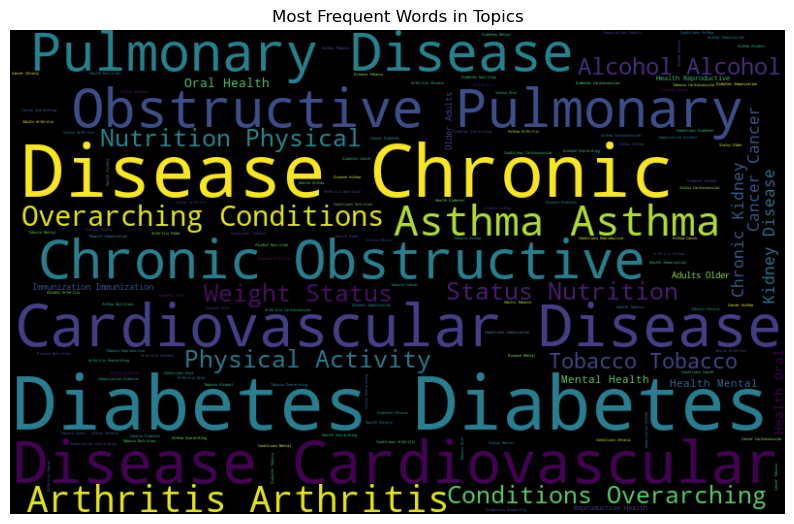

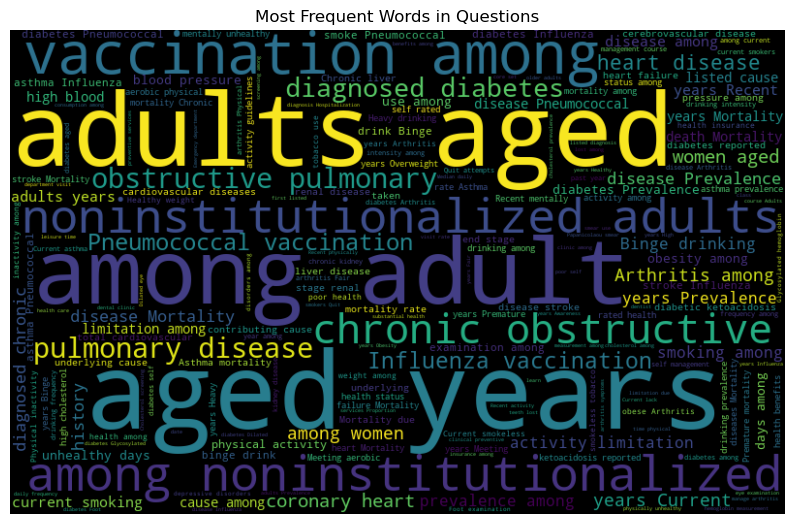

In [55]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_most_frequent_words(text_column, title):
    all_words = ' '.join([str(word) for word in text_column])  # Make sure all values are strings
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(title)
    plt.show()

# Example: Plot most frequent words from the 'Topic' column
plot_most_frequent_words(df['Topic'], 'Most Frequent Words in Topics')

# Or plot from the 'Question' column
plot_most_frequent_words(df['Question'], 'Most Frequent Words in Questions')

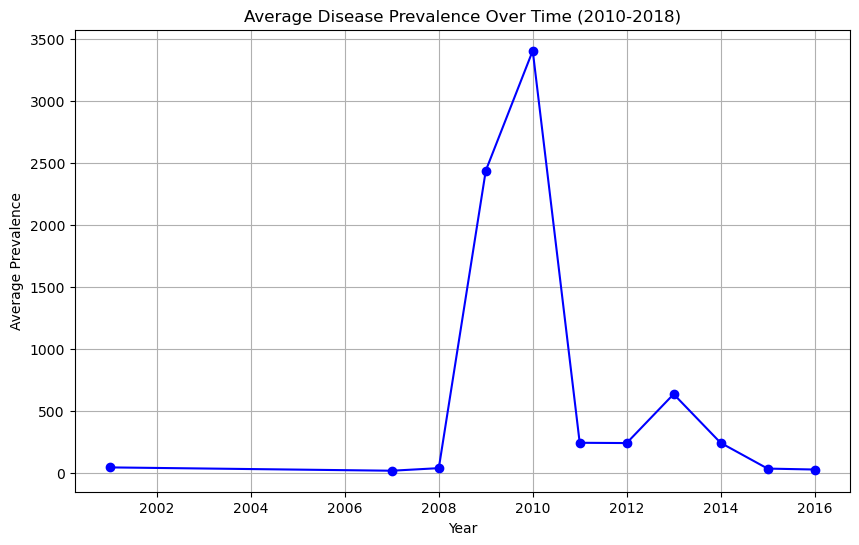

In [56]:
#1.1. Trend Over Time
#Question: How have the prevalence rates of chronic diseases changed from 2010 to 2018?
import matplotlib.pyplot as plt

# Grouping by YearStart and calculating the average DataValue for each year
yearly_trends = df.groupby('YearStart')['DataValue'].mean()

# Plotting the trend
plt.figure(figsize=(10, 6))
plt.plot(yearly_trends.index, yearly_trends.values, marker='o', linestyle='-', color='b')
plt.title('Average Disease Prevalence Over Time (2010-2018)')
plt.xlabel('Year')
plt.ylabel('Average Prevalence')
plt.grid(True)
plt.show()

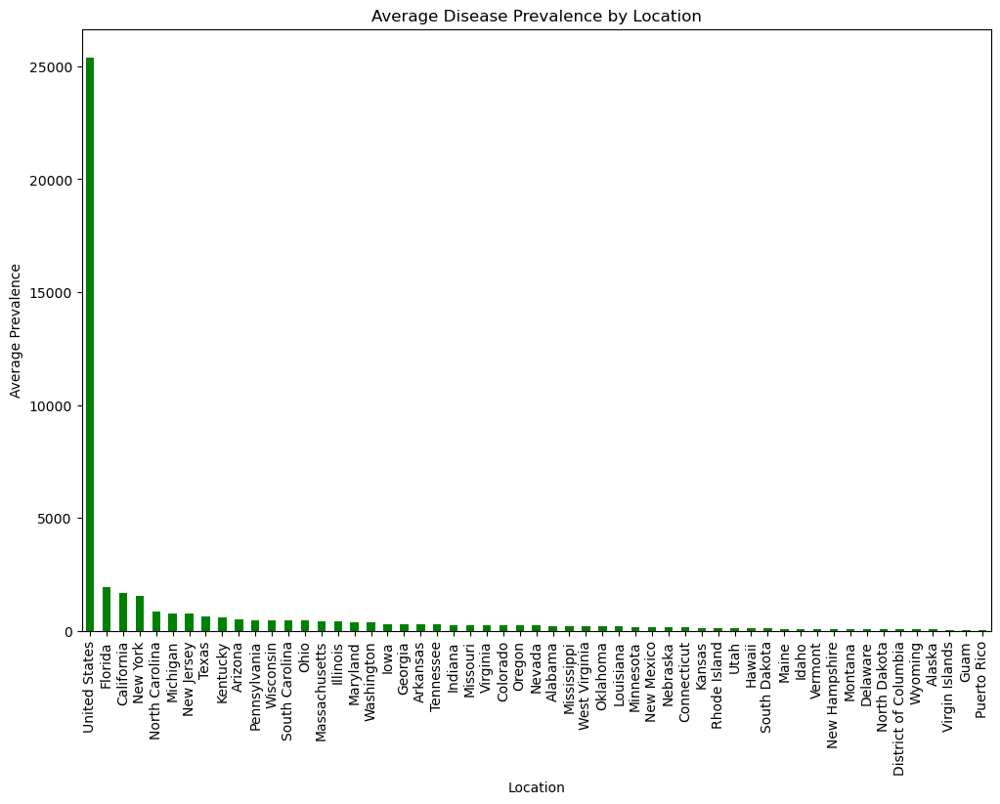

In [57]:
#2.2. Regional Variation in Disease Prevalence
#Question: How do different locations (states) compare in terms of disease prevalence?
location_trends = df.groupby('LocationDesc')['DataValue'].mean().sort_values(ascending=False)

# Plotting the regional trend
plt.figure(figsize=(12, 8))
location_trends.plot(kind='bar', color='green')
plt.title('Average Disease Prevalence by Location')
plt.xlabel('Location')
plt.ylabel('Average Prevalence')
plt.xticks(rotation=90)
plt.show()


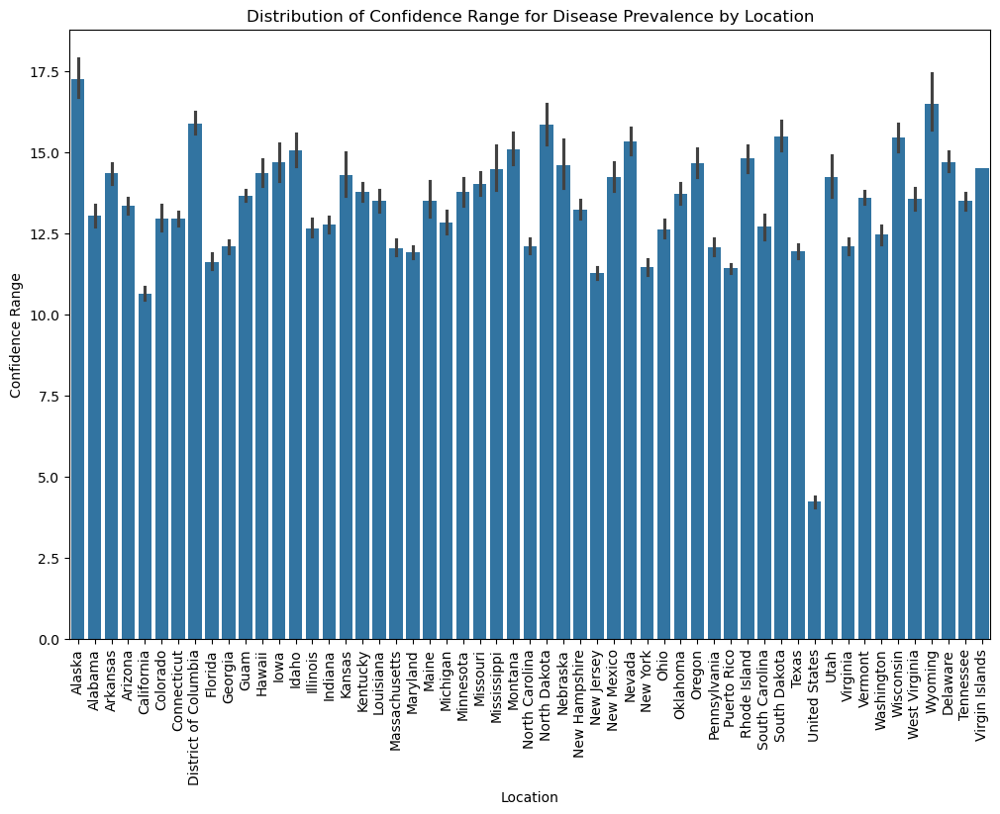

In [58]:
#3.Confidence Range for Disease Data
#Question: What is the range of confidence intervals for disease prevalence, and how does it vary across states?
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.barplot(x='LocationDesc', y='ConfidenceRange', data=df)
plt.title('Distribution of Confidence Range for Disease Prevalence by Location')
plt.xlabel('Location')
plt.ylabel('Confidence Range')
plt.xticks(rotation=90)
plt.show()

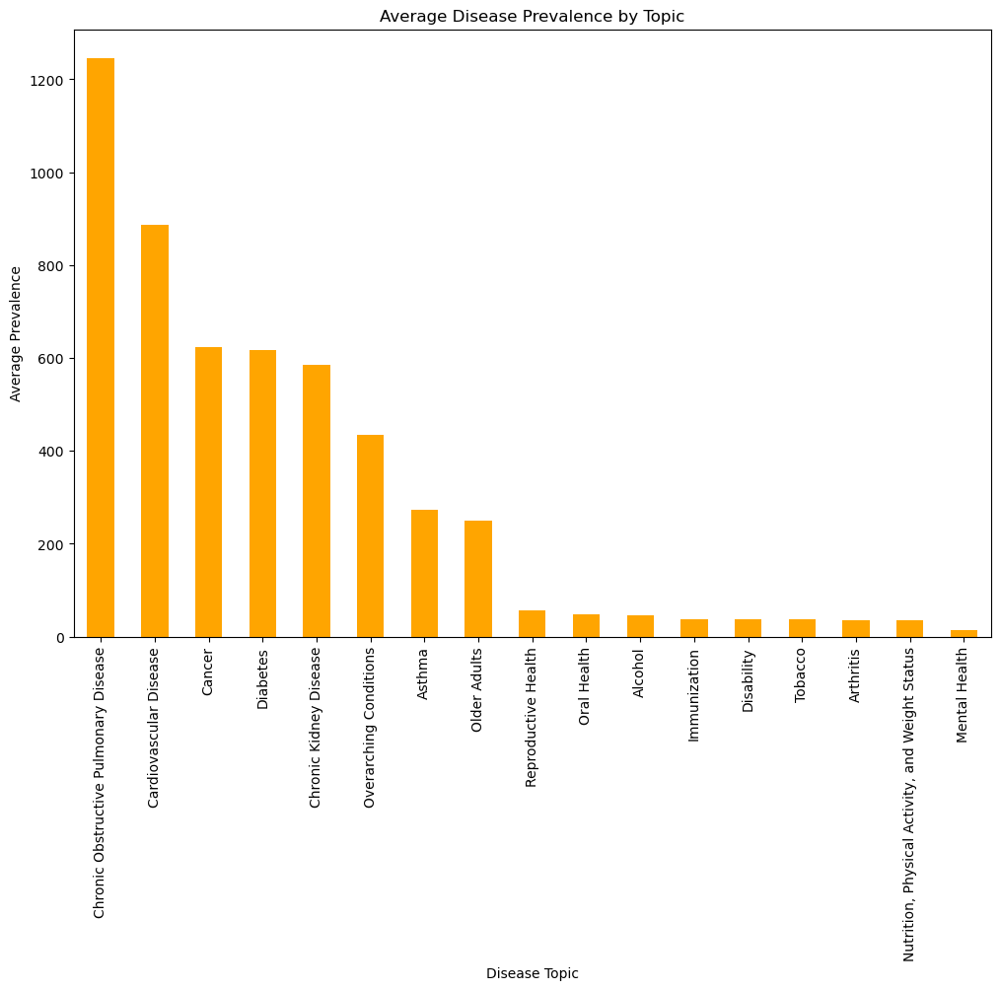

In [59]:
#4. Disease Prevalence by Topic
#Question: Which chronic disease topics (e.g., diabetes, cardiovascular disease) have the highest and lowest prevalence rates?
topic_trends = df.groupby('Topic')['DataValue'].mean().sort_values(ascending=False)

# Plotting the disease topic prevalence
plt.figure(figsize=(12, 8))
topic_trends.plot(kind='bar', color='orange')
plt.title('Average Disease Prevalence by Topic')
plt.xlabel('Disease Topic')
plt.ylabel('Average Prevalence')
plt.xticks(rotation=90)
plt.show()


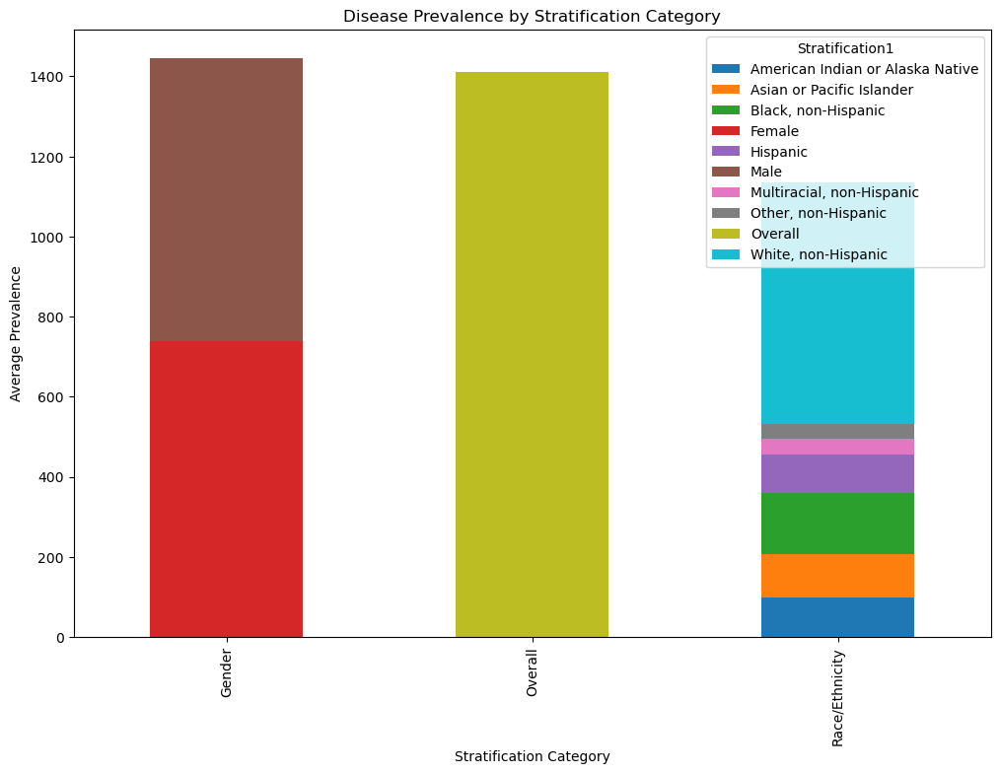

In [60]:
#5.Demographic Breakdown by Stratification
#Question: How does disease prevalence vary across different stratifications like age group, gender, or race?
stratification_trends = df.groupby(['StratificationCategory1', 'Stratification1'])['DataValue'].mean().unstack()

# Plotting the stratification-based disease prevalence
stratification_trends.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title('Disease Prevalence by Stratification Category')
plt.xlabel('Stratification Category')
plt.ylabel('Average Prevalence')
plt.show()

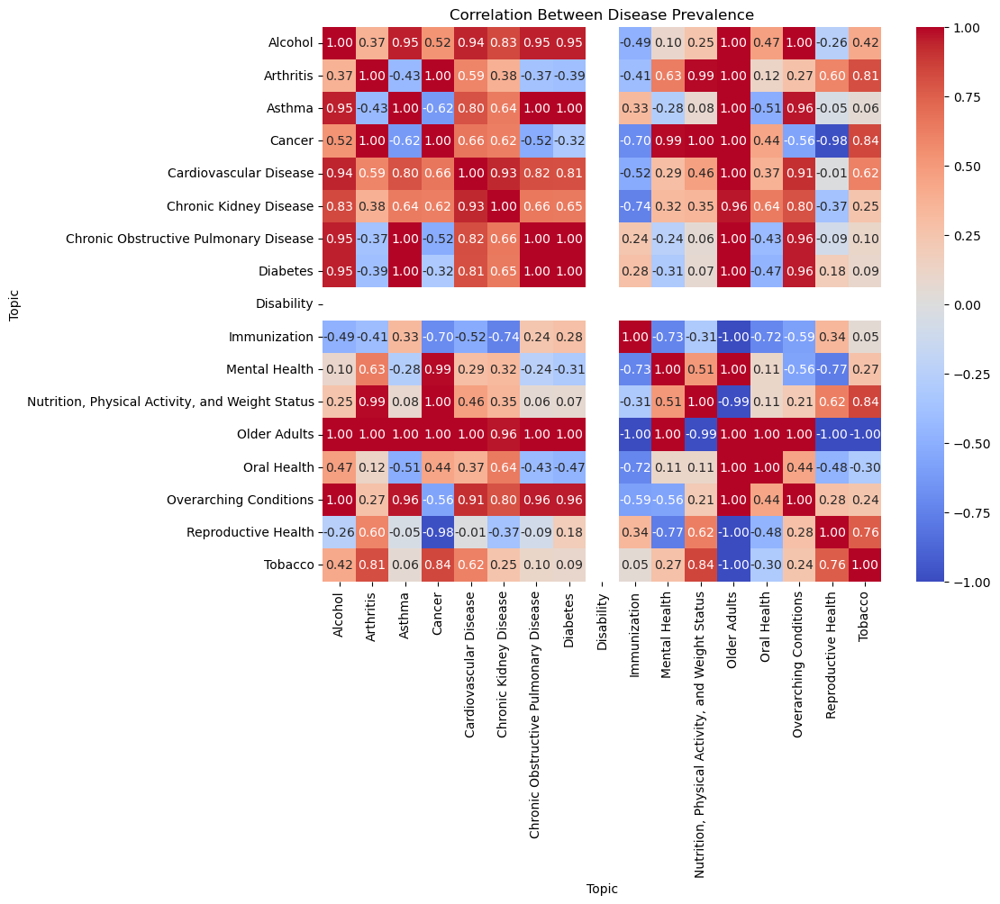

In [61]:
#6.Correlation Between Diseases
#Question: Is there a correlation between the prevalence of different diseases (e.g., diabetes and hypertension)?
# Creating a correlation matrix for disease prevalence across topics
correlation_matrix = df.pivot_table(index='YearStart', columns='Topic', values='DataValue', aggfunc='mean').corr()

# Plotting the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Between Disease Prevalence')
plt.show()

# surprisingly, there is no correlation 

In [79]:
!streamlit --version

Streamlit, version 1.41.1


In [97]:
%%writefile app.py
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from scipy import stats

# Custom CSS Styling
st.markdown("""
    <style>
    @import url('https://fonts.googleapis.com/css2?family=Space+Grotesk:wght@300;500;700&display=swap');
    
    :root {
        --primary: #2A9D8F;
        --secondary: #264653;
        --accent: #E9C46A;
        --dark: #2F3E46;
        --light: #F8F9FA;
        --highlight: #F4A261;
    }

    * {
        margin: 0;
        padding: 0;
        box-sizing: border-box;
        font-family: 'Space Grotesk', sans-serif;
    }

    body {
        background: linear-gradient(135deg, var(--dark), #333333);
        color: var(--light);
    }

    .main {
        padding: 3rem;
        background: radial-gradient(circle at center, var(--dark), #2f2f2f);
        color: var(--light);
    }

    h1 {
        color: var(--primary);
        text-align: center;
        font-weight: 700;
        font-size: 3rem;
        padding: 1.5rem 0;
        background: linear-gradient(45deg, var(--primary), var(--accent));
        -webkit-background-clip: text;
        -webkit-text-fill-color: transparent;
        text-transform: uppercase;
        letter-spacing: 2px;
        animation: glow 2s ease-in-out infinite alternate;
    }

    @keyframes glow {
        from {
            text-shadow: 0 0 10px rgba(42,157,143,0.3), 0 0 20px rgba(233,196,106,0.5);
        }
        to {
            text-shadow: 0 0 20px rgba(42,157,143,0.5), 0 0 30px rgba(233,196,106,0.7);
        }
    }

    .executive-summary {
        background: rgba(255, 255, 255, 0.1);
        border-radius: 15px;
        padding: 2rem;
        margin: 2rem 0;
        border: 1px solid var(--primary);
        box-shadow: 0 8px 32px rgba(31, 38, 135, 0.15);
    }

    .metric-card {
        background: rgba(255, 255, 255, 0.1);
        border-radius: 15px;
        padding: 1.5rem;
        margin: 1.5rem 0;
        box-shadow: 0 8px 32px rgba(31, 38, 135, 0.15);
        backdrop-filter: blur(4px);
        border: 1px solid rgba(255, 255, 255, 0.18);
        transition: all 0.3s ease;
    }

    .metric-card:hover {
        transform: translateY(-5px);
        box-shadow: 0 12px 40px rgba(31, 38, 135, 0.25);
    }

    .stButton button {
        background-color: var(--primary);
        color: var(--light);
        border-radius: 5px;
        border: none;
        padding: 0.8rem 1.5rem;
        font-weight: bold;
        text-transform: uppercase;
        letter-spacing: 1px;
        box-shadow: 0 4px 15px rgba(42, 157, 143, 0.25);
        transition: background-color 0.3s ease, box-shadow 0.3s ease;
    }

    .stButton button:hover {
        background-color: var(--accent);
        box-shadow: 0 8px 20px rgba(233, 196, 106, 0.5);
    }

    .stSelectbox, .stSlider, .stRadio {
        background-color: rgba(255, 255, 255, 0.2);
        border-radius: 10px;
        padding: 0.8rem;
        border: 1px solid var(--primary);
        margin-bottom: 1rem;
        transition: background-color 0.3s ease, transform 0.2s ease;
        color: var(--light);
    }

    .stSelectbox:hover, .stSlider:hover, .stRadio:hover {
        background-color: rgba(255, 255, 255, 0.3);
        transform: scale(1.02);
    }

    .stTextInput input {
        background-color: rgba(255, 255, 255, 0.2);
        border-radius: 10px;
        border: 1px solid var(--primary);
        color: var(--light);
        padding: 0.8rem;
        font-size: 1rem;
    }

    .stTextInput input:focus {
        border-color: var(--accent);
        outline: none;
    }

    .loading-spinner {
        animation: spin 1s linear infinite;
        width: 50px;
        height: 50px;
        border: 5px solid #f3f3f3;
        border-top: 5px solid var(--primary);
        border-radius: 50%;
        margin: 20px auto;
    }

    @keyframes spin {
        0% { transform: rotate(0deg); }
        100% { transform: rotate(360deg); }
    }

    .sidebar {
        background-color: rgba(31, 38, 135, 0.9);
        color: var(--light);
        padding: 1rem;
        border-radius: 10px;
        box-shadow: 0 4px 12px rgba(31, 38, 135, 0.3);
        transition: all 0.3s ease;
    }

    .sidebar:hover {
        background-color: var(--secondary);
    }

    .expander-header {
        font-weight: bold;
        color: var(--primary);
        font-size: 1.2rem;
        cursor: pointer;
    }

    .expander-content {
        background-color: rgba(255, 255, 255, 0.1);
        padding: 1rem;
        border-radius: 8px;
    }
    
    .stPlotlyChart {
        border-radius: 15px;
        margin-top: 2rem;
        background-color: rgba(255, 255, 255, 0.1);
    }
    </style>
""", unsafe_allow_html=True)



def handle_geolocation(df):
    """Process geolocation data if available"""
    geo_available = 'GeoLocation' in df.columns
    latlon_available = all(col in df.columns for col in ['Latitude', 'Longitude'])
    
    if geo_available and not latlon_available:
        try:
            df[['Latitude', 'Longitude']] = df['GeoLocation'].str.strip('()').str.split(',', expand=True).astype(float)
            df = df.drop(columns=['GeoLocation'])
            st.session_state.geo_warning = False
        except:
            st.session_state.geo_warning = True
    elif not latlon_available:
        st.session_state.geo_warning = True
    else:
        st.session_state.geo_warning = False
        
    return df

def generate_executive_summary(filtered_df, confidence_level):
    """Generate automated insights and recommendations"""
    summary = {
        'start_year': filtered_df['YearStart'].min(),
        'end_year': filtered_df['YearStart'].max(),
        'num_states': filtered_df['LocationDesc'].nunique(),
        'num_diseases': filtered_df['Topic'].nunique(),
        'avg_prevalence': filtered_df['DataValue'].mean(),
        'max_prevalence_state': filtered_df.groupby('LocationDesc')['DataValue'].mean().idxmax(),
        'min_prevalence_state': filtered_df.groupby('LocationDesc')['DataValue'].mean().idxmin(),
        'most_common_disease': filtered_df['Topic'].value_counts().idxmax(),
        'trend_direction': 'increasing' if filtered_df.groupby('YearStart')['DataValue'].mean().pct_change().mean() > 0 else 'decreasing',
        'ci_low': stats.norm.interval(confidence_level/100, 
                                    loc=filtered_df['DataValue'].mean(),
                                    scale=filtered_df['DataValue'].std())[0],
        'ci_high': stats.norm.interval(confidence_level/100, 
                                     loc=filtered_df['DataValue'].mean(),
                                     scale=filtered_df['DataValue'].std())[1]
    }
    
    insights = f"""
    <div class="executive-summary">
        <h3>Executive Summary</h3>
        <ul style="list-style-type:none; padding-left:0;">
            <li>📅 <strong>Analysis Period:</strong> {summary['start_year']} - {summary['end_year']}</li>
            <li>🌍 <strong>Geographic Coverage:</strong> {summary['num_states']} states analyzed</li>
            <li>🦠 <strong>Disease Focus:</strong> {summary['num_diseases']} chronic conditions tracked</li>
            <li>📈 <strong>Prevalence Trend:</strong> {summary['trend_direction'].capitalize()} trend observed</li>
            <li>🏆 <strong>High Prevalence Area:</strong> {summary['max_prevalence_state']} shows highest rates</li>
            <li>🩺 <strong>Most Common Condition:</strong> {summary['most_common_disease']}</li>
            <li>📉 <strong>Confidence Range:</strong> {confidence_level}% CI ({summary['ci_low']:.1f}% - {summary['ci_high']:.1f}%)</li>
        </ul>
        <div style="margin-top:1.5rem; border-top:1px solid var(--primary); padding-top:1rem;">
            <h4>Key Recommendations</h4>
            <ul style="list-style-type:none; padding-left:0;">
                <li>🔍 Focus interventions in {summary['max_prevalence_state']} for maximum impact</li>
                <li>📊 Prioritize research on {summary['most_common_disease']} prevalence drivers</li>
                <li>🌡️ Monitor {summary['min_prevalence_state']} for best practice identification</li>
                <li>📈 Allocate resources for {summary['trend_direction']} trend management</li>
            </ul>
        </div>
    </div>
    """
    return insights

def main():
    st.title("Chronic Disease Prevalence Analysis")
    
    # File Upload
    uploaded_file = st.sidebar.file_uploader("📤 Upload Dataset", type="csv", 
                         help="Upload CDC Chronic Disease CSV data")

    if uploaded_file:
        df = pd.read_csv(uploaded_file)
        
        # ========== Data Preparation Section ==========
        st.sidebar.header("🔧 Data Preparation")
        with st.sidebar.expander("Column Management"):
            cols_to_drop = st.multiselect("Select columns to remove", df.columns)
            if st.button("Confirm Removal"):
                df = df.drop(columns=cols_to_drop, errors='ignore')
                st.session_state.cleaned_df = df.copy()
        
        if 'cleaned_df' in st.session_state:
            df = st.session_state.cleaned_df
        
        # Data Cleaning
        with st.expander("Data Cleaning Console", expanded=True):
            col1, col2 = st.columns(2)
            with col1:
                st.write("Missing Values Summary:")
                missing = df.isnull().sum()
                st.write(missing)
            
            with col2:
                st.write("Data Types Summary:")
                dtypes = df.dtypes
                st.write(dtypes)
            
            if st.button("Clean Data Automatically"):
                required_cols = ['DataValue']
                if 'GeoLocation' in df.columns:
                    required_cols.append('GeoLocation')
                
                # Clean core data
                df = df.dropna(subset=required_cols)
                df['DataValue'] = pd.to_numeric(df['DataValue'], errors='coerce')
                df = df.dropna(subset=['DataValue'])
                
                # Handle geolocation
                df = handle_geolocation(df)
                
                st.session_state.cleaned_df = df.copy()
                st.success("Automatic cleaning completed!")

        # ========== Advanced Filters ==========
        st.sidebar.header("🔮 Analysis Parameters")
        with st.sidebar.expander("Core Filters"):
            selected_years = st.slider('Select Years', 
                                     min_value=int(df['YearStart'].min()),
                                     max_value=int(df['YearStart'].max()),
                                     value=(int(df['YearStart'].min()), int(df['YearStart'].max())))

            selected_states = st.multiselect('Select States', 
                                           options=df['LocationDesc'].unique(),
                                           default=df['LocationDesc'].unique()[:3])

            selected_diseases = st.multiselect('Select Diseases',
                                              options=df['Topic'].unique(),
                                              default=df['Topic'].unique()[:2])

        with st.sidebar.expander("Advanced Controls"):
            confidence_level = st.slider("Confidence Level", 80, 99, 95)
            show_confidence = st.checkbox("Show Confidence Intervals")
            analysis_type = st.selectbox("Analysis Type", 
                                       ["Trend Analysis", "Comparative Analysis", "Geospatial Analysis"])

        # Apply Filters
        filtered_df = df[
            (df['YearStart'].between(*selected_years)) & 
            (df['LocationDesc'].isin(selected_states)) & 
            (df['Topic'].isin(selected_diseases))
        ]

        # ========== Executive Summary ==========
        st.markdown(generate_executive_summary(filtered_df, confidence_level), unsafe_allow_html=True)

        # ========== Main Dashboard ==========
        st.header("📊 Key Performance Indicators")
        col1, col2, col3, col4 = st.columns(4)
        with col1:
            st.markdown(f"""
                <div class="metric-card">
                    <h3>Avg Prevalence</h3>
                    <span style="font-size:1.5em; color:#2A9D8F">
                        {filtered_df['DataValue'].mean():.1f}%
                    </span>
                </div>
            """, unsafe_allow_html=True)
        
        with col2:
            st.markdown(f"""
                <div class="metric-card">
                    <h3>States</h3>
                    <span style="font-size:1.5em; color:#E9C46A">
                        {filtered_df['LocationDesc'].nunique()}
                    </span>
                </div>
            """, unsafe_allow_html=True)
        
        with col3:
            st.markdown(f"""
                <div class="metric-card">
                    <h3>Diseases</h3>
                    <span style="font-size:1.5em; color:#F4A261">
                        {filtered_df['Topic'].nunique()}
                    </span>
                </div>
            """, unsafe_allow_html=True)
        
        with col4:
            ci_low, ci_high = stats.norm.interval(confidence_level/100, 
                                                loc=filtered_df['DataValue'].mean(),
                                                scale=filtered_df['DataValue'].std())
            st.markdown(f"""
                <div class="metric-card">
                    <h3>{confidence_level}% CI</h3>
                    <span style="font-size:1.2em; color:#2A9D8F">
                        {ci_low:.1f}% - {ci_high:.1f}%
                    </span>
                </div>
            """, unsafe_allow_html=True)

        # ========== Advanced Visualizations ==========
        st.header("🔍 Analytical Insights")
        
        # Trend Analysis
        with st.expander("Temporal Trends Analysis", expanded=True):
            col1, col2 = st.columns([3,1])
            with col1:
                trend_fig = px.line(filtered_df, x="YearStart", y="DataValue", 
                                  color="Topic", facet_col="LocationDesc",
                                  title="Disease Prevalence Trends by State",
                                  template="plotly_dark")
                st.plotly_chart(trend_fig, use_container_width=True)
            
            with col2:
                st.subheader("Top Diseases")
                top_diseases = filtered_df.groupby('Topic')['DataValue'].mean().nlargest(5)
                st.write(top_diseases)

        # Comparative Analysis
        with st.expander("State-wise Comparison"):
            col1, col2 = st.columns(2)
            with col1:
                state_comparison = filtered_df.groupby('LocationDesc')['DataValue'].agg(['mean', 'std'])
                state_comparison['ci_low'] = state_comparison['mean'] - 1.96*state_comparison['std']
                state_comparison['ci_high'] = state_comparison['mean'] + 1.96*state_comparison['std']
                
                fig = go.Figure()
                fig.add_trace(go.Bar(
                    x=state_comparison.index,
                    y=state_comparison['mean'],
                    error_y=dict(
                        type='data',
                        array=state_comparison['std'],
                        visible=True)
                ))
                fig.update_layout(title="State-wise Prevalence with Confidence Range",
                                template="plotly_dark")
                st.plotly_chart(fig, use_container_width=True)
            
            with col2:
                st.subheader("Statistical Summary")
                st.write(state_comparison.describe())

        # Geospatial Analysis
        with st.expander("Geospatial Distribution"):
            if all(col in filtered_df.columns for col in ['Latitude', 'Longitude']):
                geospatial_fig = px.density_mapbox(filtered_df, lat='Latitude', lon='Longitude', 
                                                 z='DataValue', radius=20,
                                                 mapbox_style="carto-darkmatter",
                                                 zoom=3, height=600,
                                                 title="Disease Prevalence Heatmap")
                st.plotly_chart(geospatial_fig, use_container_width=True)
            else:
                st.warning("Geospatial data not available in the dataset")

        # Frequency Analysis
        with st.expander("Disease Frequency Analysis"):
            col1, col2 = st.columns(2)
            with col1:
                disease_freq = filtered_df['Topic'].value_counts().nlargest(10)
                freq_fig = px.bar(disease_freq, orientation='h', 
                                title="Most Frequent Diseases",
                                template="plotly_dark")
                st.plotly_chart(freq_fig, use_container_width=True)
            
            with col2:
                st.subheader("Prevalence Distribution")
                dist_fig = px.violin(filtered_df, y="DataValue", box=True,
                                   title="Prevalence Distribution",
                                   template="plotly_dark")
                st.plotly_chart(dist_fig, use_container_width=True)

    else:
        st.markdown("""
            <div style="text-align:center; padding:5rem;">
                <h2 style="color:#2A9D8F;">📁 Upload Data to Begin Analysis</h2>
                <p style="color:#264653;">Use the left sidebar to upload your CDC Chronic Disease dataset</p>
            </div>
        """, unsafe_allow_html=True)

if __name__ == "__main__":
    main()

Writing app.py


In [ ]:
!streamlit run app.py
